<a href="https://colab.research.google.com/github/dzkmrn/2141720076-pcvk-2023/blob/main/Week13_Kuiz2PCVK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Kuis 2 - PCVK


### Kelompok 5
1. Abdul Basith Bahi
2. Bagus Rezky Adhyaksa
3. Maulana Arif Wijaya
4. Muhammad Dzaka Murran Rusid
5. Sely Ruli Amanda
6. Studi Kasus


Silakan mengerjakan pertanyaan di bawah ini dengan benar dan jujur.

Mengerjakan secara kelompok yang terdiri dari 5 anggota
1. Kumpulkan e-ktp anggota keluarga atau kelas pada kelompok minimal 5 buah sebagai dataset. 1 foto bisa berbagai pose ketika pengambilan foto e-ktp.
2. Deteksi dan kenali foto wajah e-ktp tersebut menggunakan metode yang telah dipelajari baik pada matakulilah PCVK ataupun matakuliah lain pada semester ini.
3. Presentasikan di depan kelas hasil dari pekerjaan kelompok Anda, paparkan hasil dari pekerjaan tersebut secara detail lengkap dengan tangkapan layar bagian dari; (1)pre-processing, (2)lokalisasi, (3)segmentasi, dan (4)pengenalan.
4. Jangan lupa upload juga kode program tersebut pada repository
Kumpulkan link file presentasi dalam bentuk pdf dan link repository.

Selamat mengerjaan, semua anggota kelompok wajib saling berkontribusi.

### Langkah 1: Impor library

In [8]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from PIL import Image
from sklearn.cluster import KMeans

### Langkah 2: Load Drive dan menampilkan citra original

In [9]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
folder_path = '/content/drive/MyDrive/pcvk/minggu13/ktp_belum_crop/BELUM CROP'

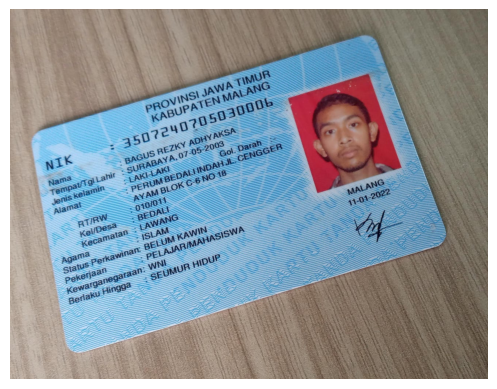

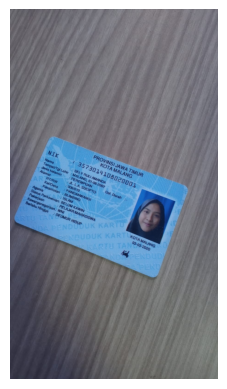

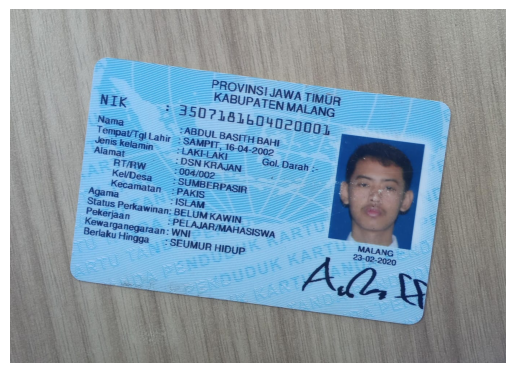

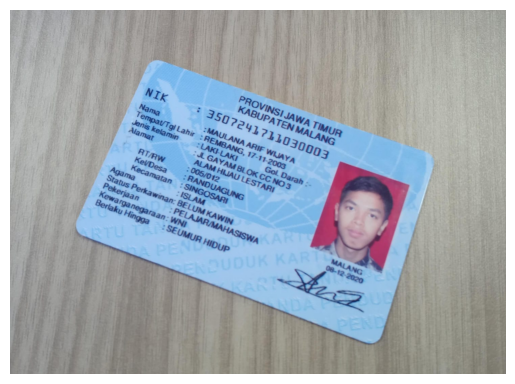

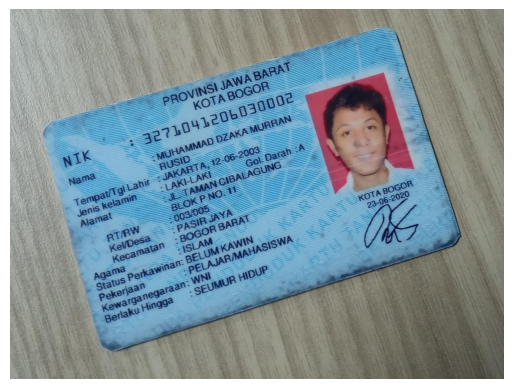

In [12]:
ktp_files = [file for file in os.listdir(folder_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

ktp_files = sorted(ktp_files)

# Iterasi pada gambar-gambar KTP
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    # Tampilkan gambar
    plt.figure()
    plt.axis('off')
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    plt.show()


### Langkah 3: Pre-processing

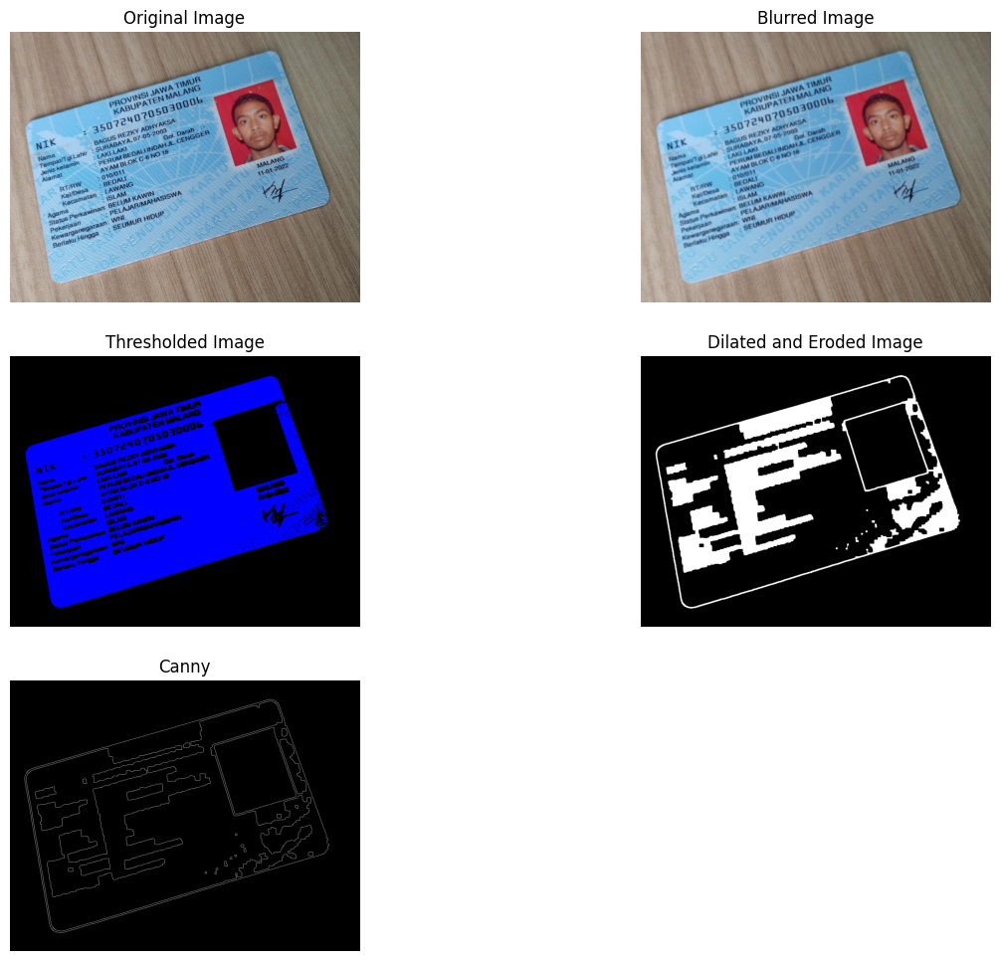

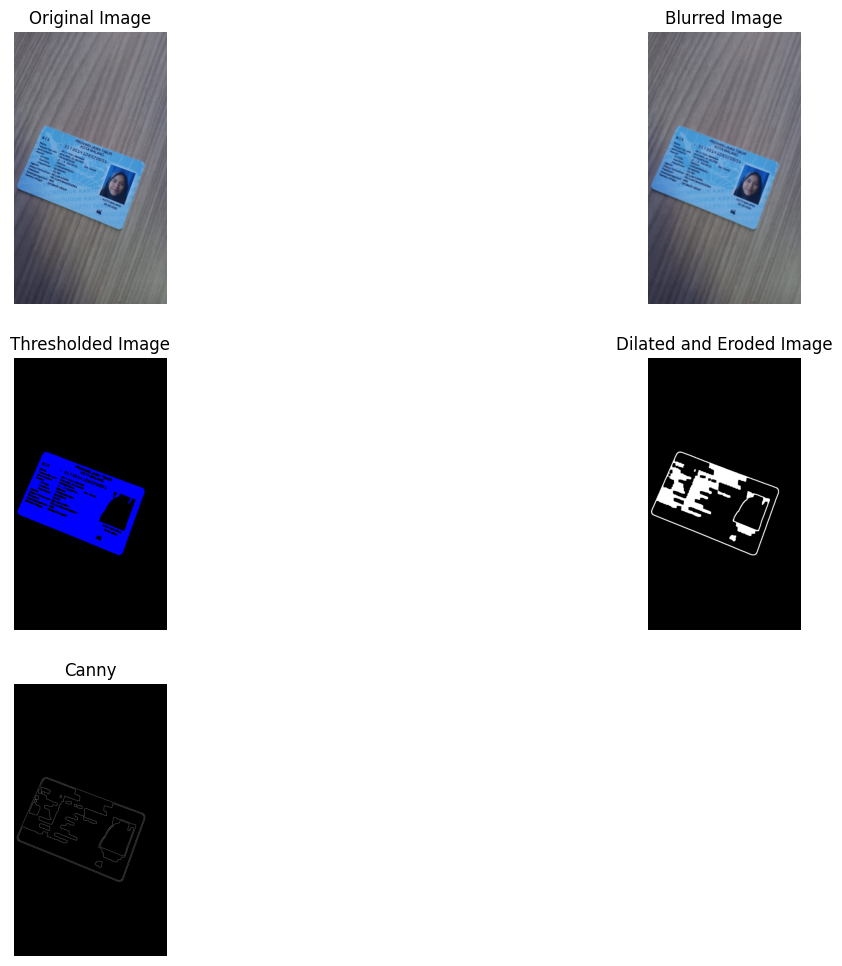

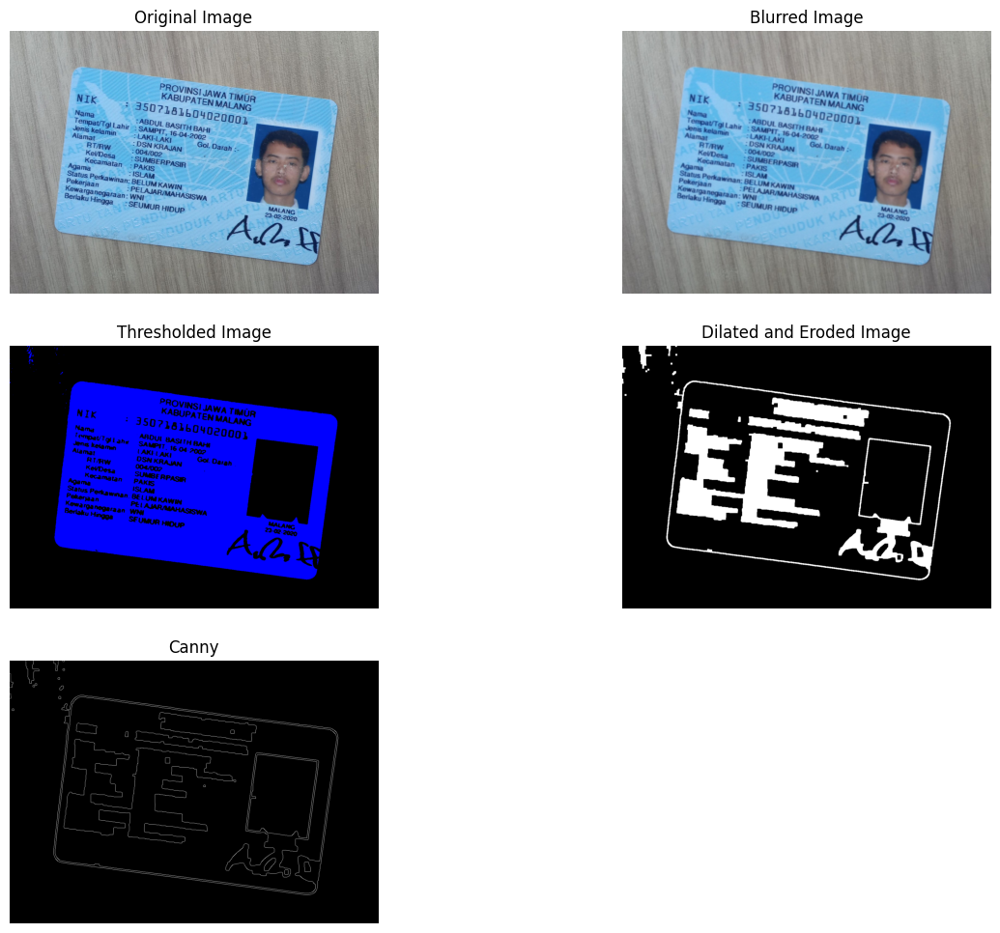

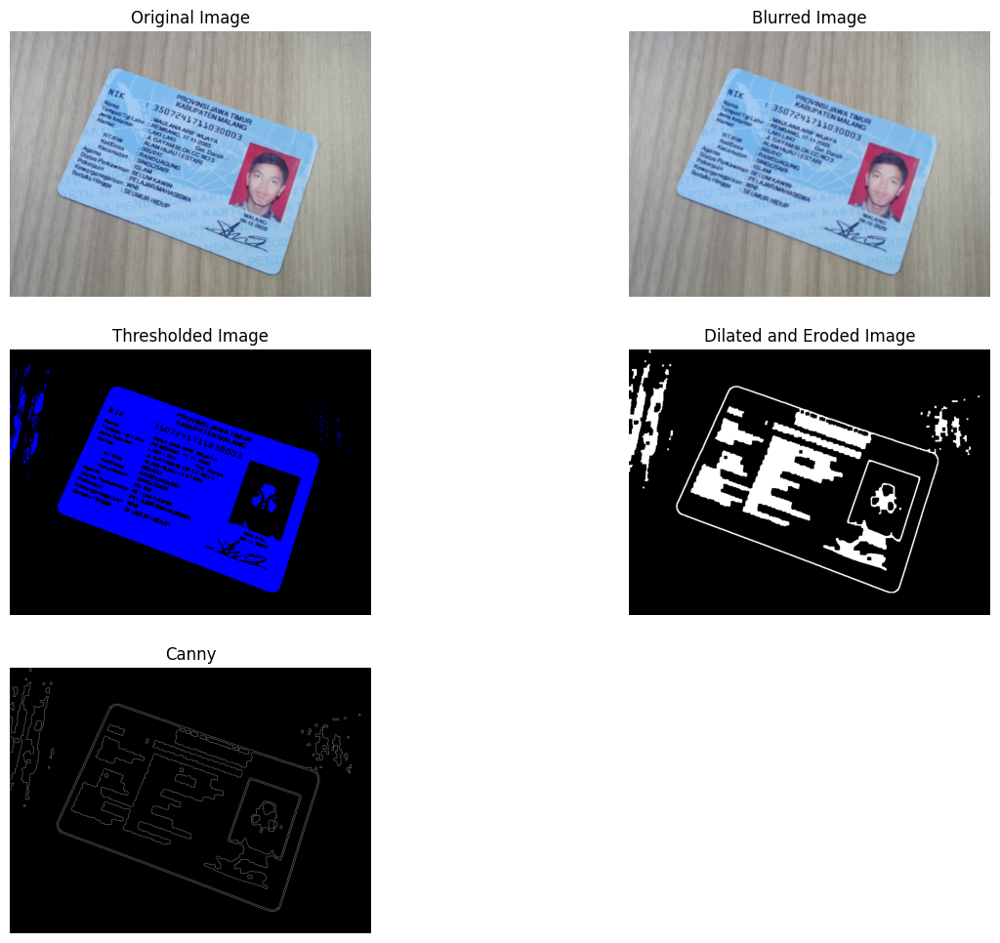

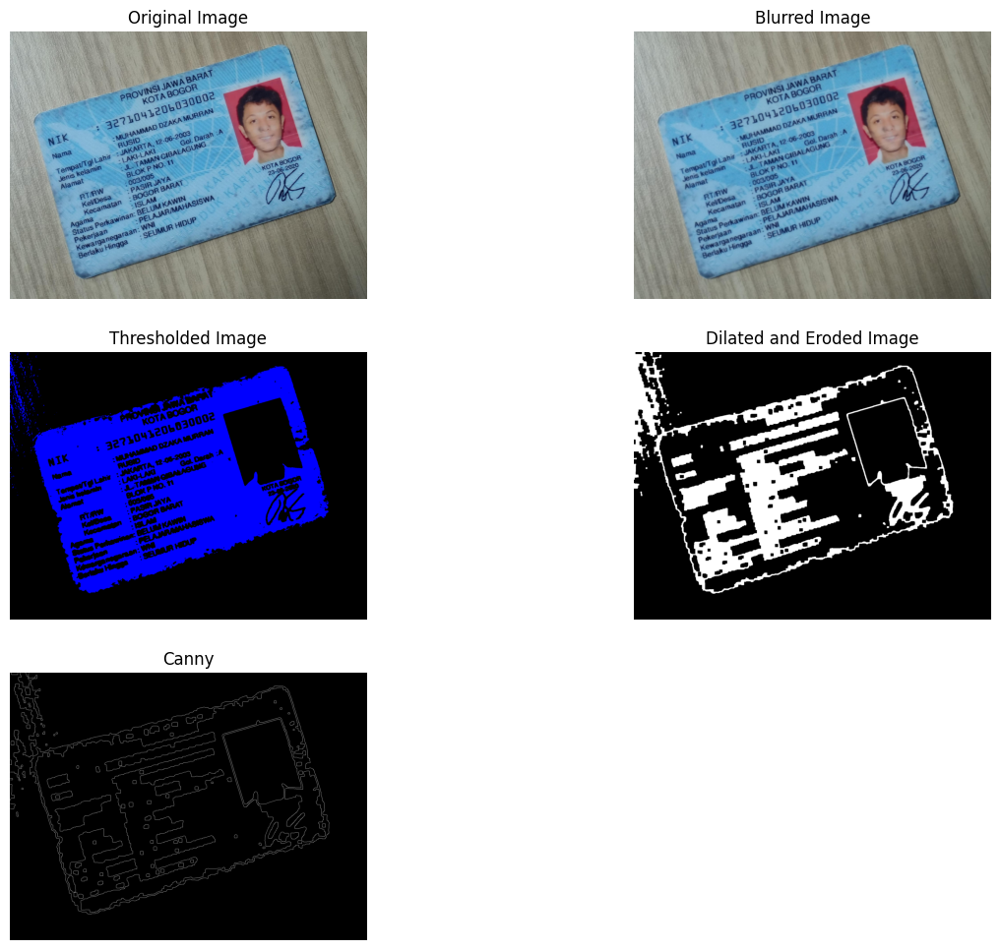

In [13]:

def detect_cards(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.blur(gray, (7, 7))
    lt = 900
    edged = cv2.Canny(gray, lt, lt * 3)

    return edged

def proccess_card(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

    return image

def order_points(pts):
  rect = np.zeros((4, 2), dtype = "float32")
  s = pts.sum(axis = 1)
  rect[0] = pts[np.argmin(s)]
  rect[2] = pts[np.argmax(s)]
  diff = np.diff(pts, axis = 1)
  rect[1] = pts[np.argmin(diff)]
  rect[3] = pts[np.argmax(diff)]
  return rect

def four_point_transform(image, pts):
  rect = order_points(pts)
  (tl, tr, br, bl) = rect
  widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
  widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
  maxWidth = max(int(widthA), int(widthB))
  heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
  heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
  maxHeight = max(int(heightA), int(heightB))
  dst = np.array([
    [0, 0],
    [maxWidth - 1, 0],
    [maxWidth - 1, maxHeight - 1],
    [0, maxHeight - 1]], dtype = "float32")
  M = cv2.getPerspectiveTransform(rect, dst)
  warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
  return warped


# Iterasi pada gambar-gambar KTP
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    blur = cv2.blur(ktp_image, (5,5))
    _, mask = cv2.threshold(blur, 180, 255, cv2.THRESH_BINARY)
    mask[:,:,1] = 0
    mask[:,:,2] = 0

    lt = 50
    edges = cv2.Canny(mask, lt, lt * 3)

    kernel = np.ones((5, 5), np.uint8)

    dilatation_dst = cv2.dilate(edges, kernel , iterations=4)
    erosion = cv2.erode(dilatation_dst,kernel,iterations = 3)

    # Deteksi tepi menggunakan Canny
    edges = cv2.Canny(erosion, 50, 150)

    plt.figure(figsize=(15, 12))

    plt.subplot(3, 2, 1)
    plt.imshow(cv2.cvtColor(ktp_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 2, 2)
    plt.imshow(cv2.cvtColor(blur, cv2.COLOR_BGR2RGB))
    plt.title('Blurred Image')
    plt.axis('off')

    plt.subplot(3, 2, 3)
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title('Thresholded Image')
    plt.axis('off')

    plt.subplot(3, 2, 4)
    plt.imshow(cv2.cvtColor(erosion, cv2.COLOR_BGR2RGB))
    plt.title('Dilated and Eroded Image')
    plt.axis('off')

    plt.subplot(3, 2, 5)
    plt.imshow(cv2.cvtColor(edges, cv2.COLOR_BGR2RGB))
    plt.title('Canny')
    plt.axis('off')

    plt.show()

### Langkah 4: Localization

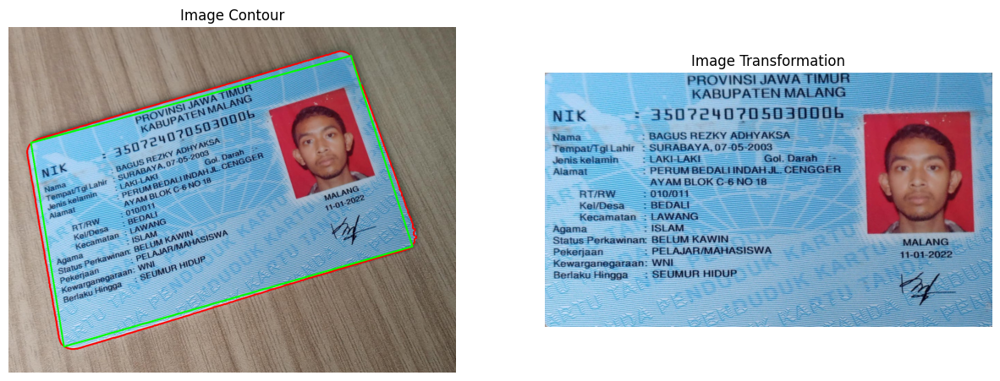

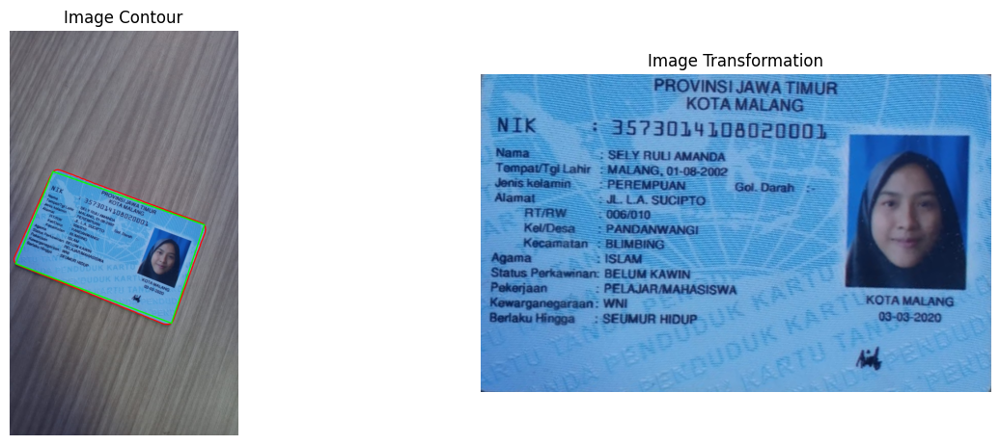

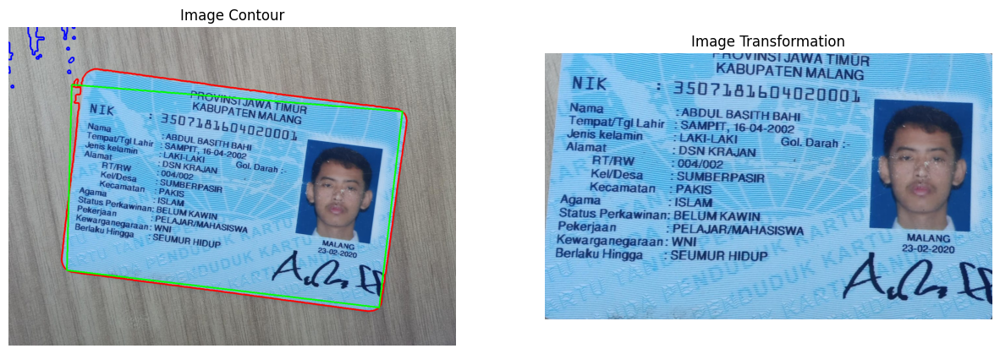

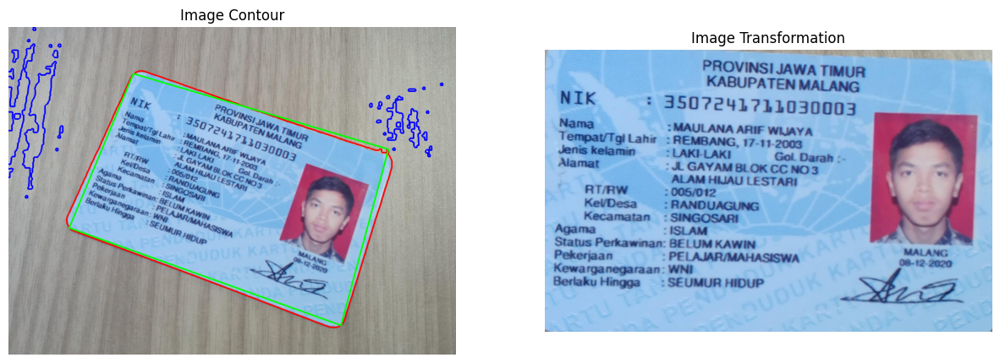

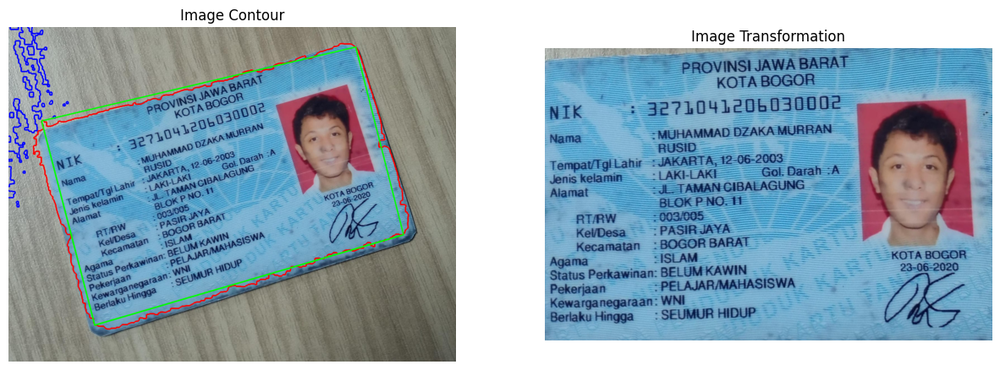

In [14]:
cropped_images = []

# Iterasi pada gambar-gambar KTP
for i, ktp_file in enumerate(ktp_files):
    ktp_path = os.path.join(folder_path, ktp_file)
    ktp_image = cv2.imread(ktp_path)

    blur = cv2.blur(ktp_image, (5,5))

    _, mask = cv2.threshold(blur, 180, 255, cv2.THRESH_BINARY)

    mask[:,:,1] = 0;
    mask[:,:,2] = 0;

    lt = 50
    edges = cv2.Canny(mask, lt, lt * 3)

    kernel = np.ones((5, 5), np.uint8)

    dilatation_dst = cv2.dilate(edges, kernel , iterations=4)
    erosion = cv2.erode(dilatation_dst,kernel,iterations = 3)

    # # Deteksi tepi menggunakan Canny
    edges = cv2.Canny(erosion, 50, 150)

    # cv2.drawContours(ktp_test, contours, -1, (0, 0, 255), 2)
    # cv2_imshow(ktp_test)

    contours, img = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    image_contour = ktp_image.copy()

    # # Initialize variables to store the largest rectangle
    max_area = 0
    best_rect = None

    # Loop through each contour
    for contour in contours:
        # Approximate the contour to a polygon
        epsilon = 0.02 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)

        # Check if the polygon has 4 vertices (rectangle)
        if len(approx) == 4:
            # Calculate the area of the rectangle
            area = cv2.contourArea(approx)

            # Update the largest rectangle if the current one is bigger
            if area > max_area:
                max_area = area
                best_rect = approx

    areas = [cv2.contourArea(c) for c in contours]
    max_index = np.argmax(areas)

    cv2.drawContours(image_contour, contours, -1, (255, 0, 0), 4)
    cv2.drawContours(image_contour, [contours[max_index]], -1, (0, 0, 255), 4)
    cv2.drawContours(image_contour, [best_rect], -1, (0, 255, 0), 4)

    warped = four_point_transform(ktp_image, best_rect.reshape(4, 2))

    plt.figure(figsize=(15, 12))

    plt.subplot(2, 2, 1)
    plt.imshow(cv2.cvtColor(image_contour, cv2.COLOR_BGR2RGB))
    plt.title('Image Contour')
    plt.axis('off')

    # cv2_imshow(image_contour)
    plt.subplot(2, 2, 2)
    plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    plt.title('Image Transformation')
    plt.axis('off')
    # cv2_imshow(warped)

    cropped_images.append(warped)

### Langkah 5: Load Face Cascade

In [16]:
cascade_wajah = cv2.CascadeClassifier('/content/drive/MyDrive/pcvk/minggu13/ktp_belum_crop/haarcascade_frontalface_alt.xml')

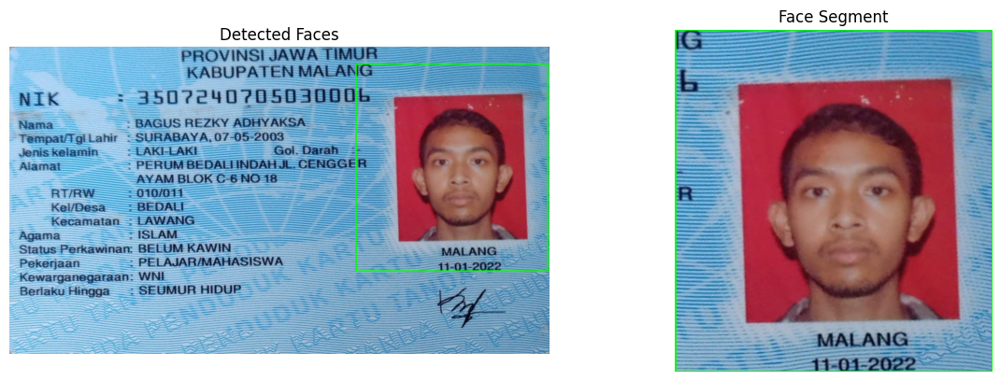

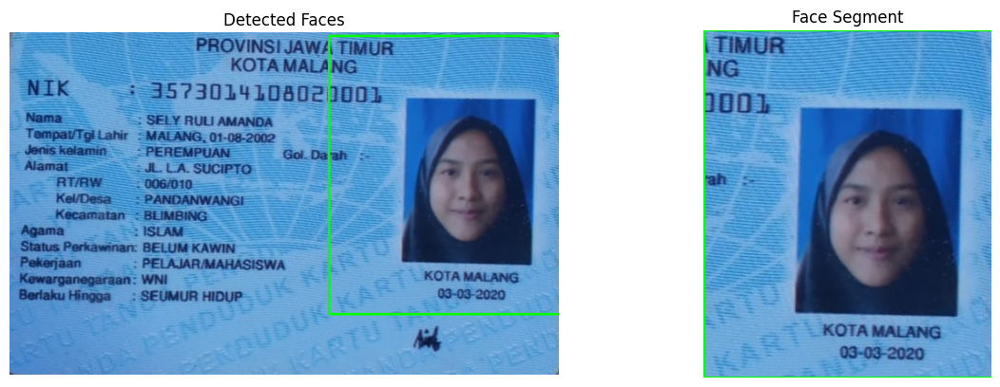

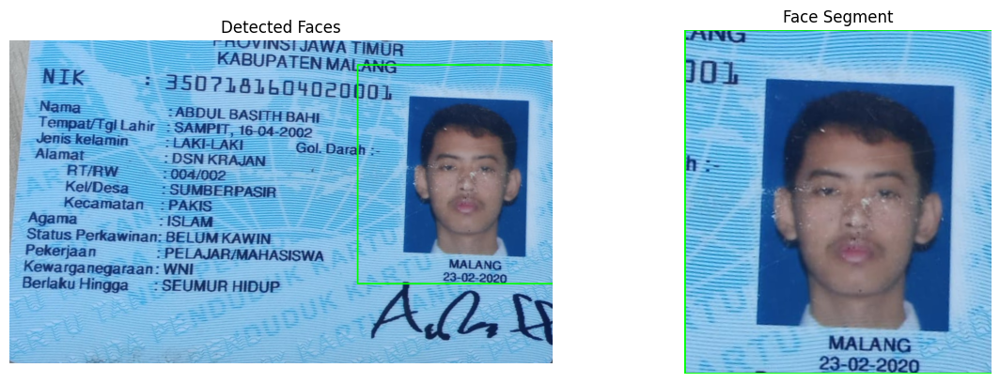

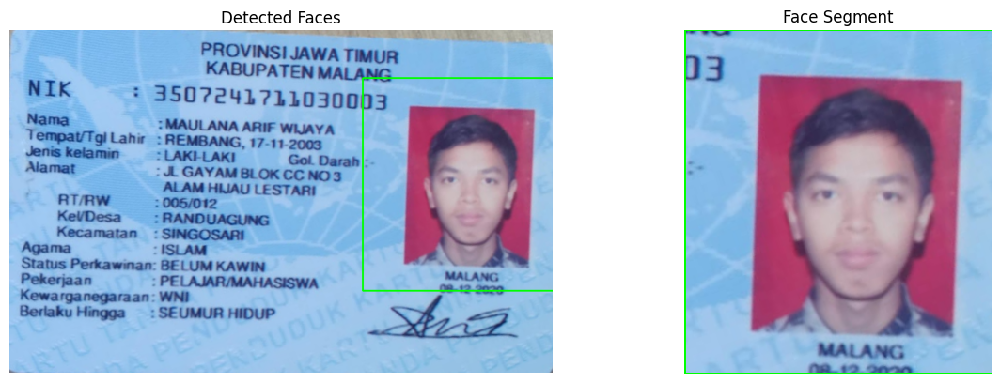

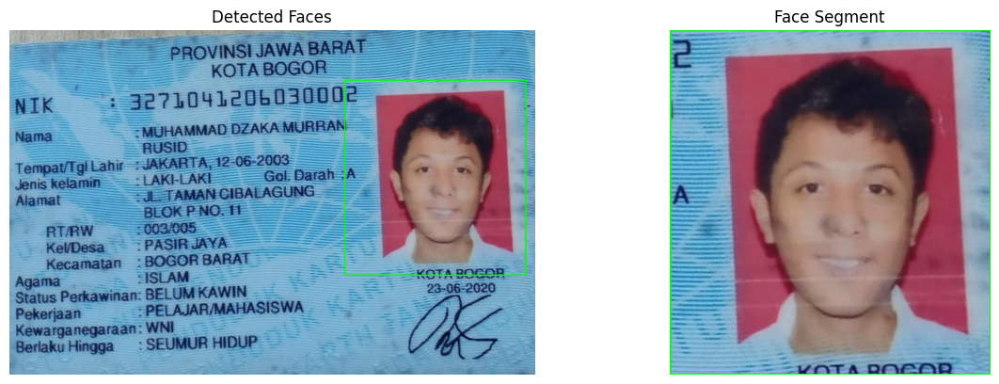

In [17]:
face_detection = []

for img in cropped_images:

  roi_wajah = cascade_wajah.detectMultiScale(img)

  (x, y, w, h) = roi_wajah[0]

  cv2.rectangle(img, (x - 110, y-120), (x + w + 80, y + h+ 100), (0, 255, 0), 2)

  face_det = img.copy()
  face_segment = face_det[y - 120:y + h + 100, x - 110:x + w + 80]

  plt.figure(figsize=(12, 8))

  plt.subplot(2, 2, 1)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.title('Detected Faces')
  plt.axis('off')

  plt.subplot(2, 2, 2)
  plt.imshow(cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB))
  plt.title('Face Segment')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

  face_detection.append(face_segment)

### Langkah 6: Load Model

In [18]:
from keras.models import load_model
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Disable scientific notation for clarity
np.set_printoptions(suppress=True)

# Load the model
model = load_model("/content/drive/MyDrive/pcvk/minggu13/ktp_belum_crop/converted_keras/keras_model.h5", compile=False)

# Load the labels
class_names = open("/content/drive/MyDrive/pcvk/minggu13/ktp_belum_crop/converted_keras/labels.txt", "r").readlines()

### Langkah 7: Face Recognition

1/1 [==============================] - 1s 1s/step
Class: Rezki
Confidence Score: 100 %

1/1 [==============================] - 0s 42ms/step
Class: Sely
Confidence Score: 98 %

1/1 [==============================] - 0s 50ms/step
Class: Basith
Confidence Score: 100 %

1/1 [==============================] - 0s 40ms/step
Class: Maulana
Confidence Score: 69 %

1/1 [==============================] - 0s 41ms/step
Class: Dzaka
Confidence Score: 75 %



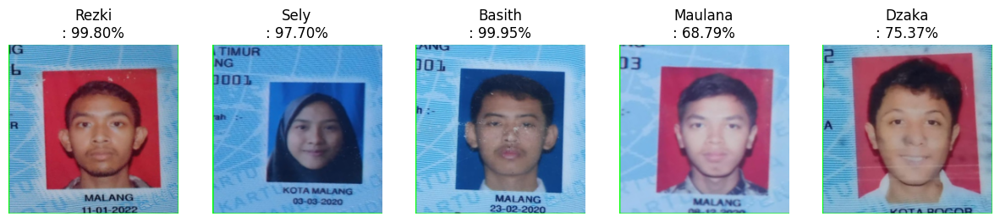

In [19]:
fig, axes = plt.subplots(1, 5, figsize=(15, 3))

for i, face_segment in enumerate(face_detection):
    # Convert the image to RGB
    image = cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB)

    # Resize the image
    image = cv2.resize(image, (224, 224), interpolation=cv2.INTER_AREA)

    # Preprocess the image for the model
    image_for_model = np.asarray(image, dtype=np.float32).reshape(1, 224, 224, 3)
    image_for_model = (image_for_model / 127.5) - 1

    # Predict using the model
    prediction = model.predict(image_for_model)

    index = np.argmax(prediction)
    class_name = class_names[index]
    confidence_score = prediction[0][index]

    # Show the image on the i-th subplot with title
    axes[i].imshow(image)
    axes[i].set_title(f'{class_name[2:]}: {confidence_score:.2%}')
    axes[i].axis('off')

    print("Class:", class_name[2:], end="")
    print("Confidence Score:", str(np.round(confidence_score * 100))[:-2], "%\n")

# Tampilkan plot
plt.show()

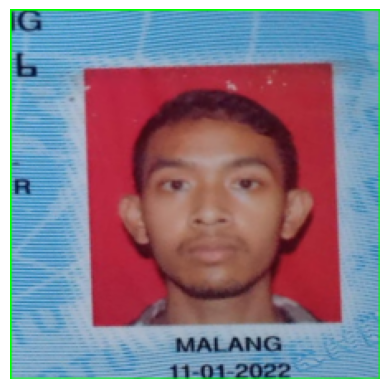

1/1 [==============================] - 0s 49ms/step
[[0.00090559 0.9980369  0.00003818 0.00027618 0.00074307]]
Class: Rezki
Confidence Score: 100 %



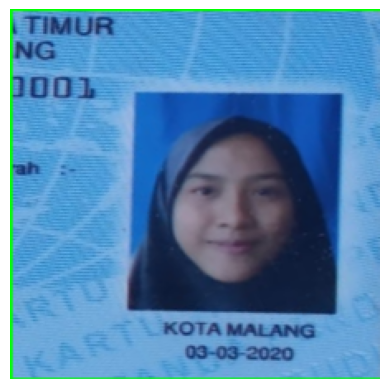

1/1 [==============================] - 0s 40ms/step
[[0.00653546 0.01617844 0.9770418  0.00000059 0.00024377]]
Class: Sely
Confidence Score: 98 %



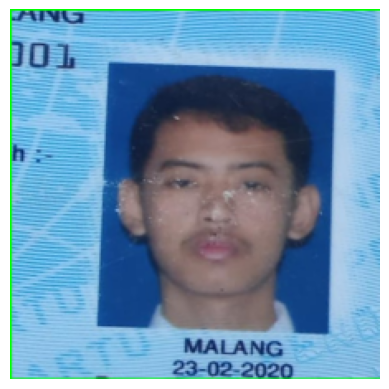

1/1 [==============================] - 0s 41ms/step
[[0.00001186 0.0003477  0.00008445 0.00006176 0.9994942 ]]
Class: Basith
Confidence Score: 100 %



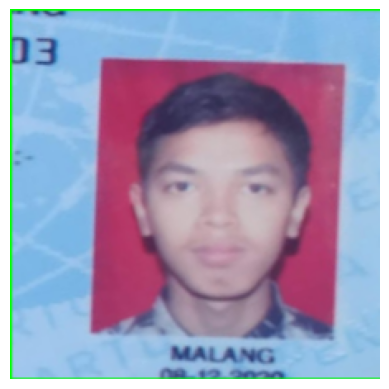

1/1 [==============================] - 0s 38ms/step
[[0.6879355  0.07629441 0.00574941 0.22766703 0.00235365]]
Class: Maulana
Confidence Score: 69 %



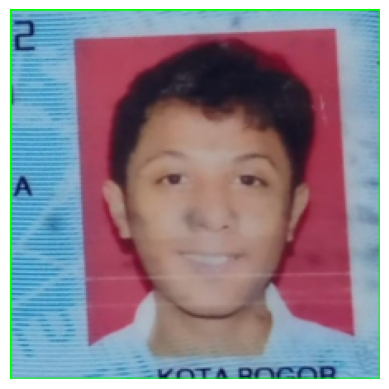

1/1 [==============================] - 0s 43ms/step
[[0.03146895 0.15382141 0.00097047 0.7536528  0.06008634]]
Class: Dzaka
Confidence Score: 75 %



In [20]:
for face_segment in face_detection:
    # # Convert the image to RGB
    image = cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB)

    # Resize the image
    image = cv2.resize(image, (224, 224), interpolation=cv2.INTER_AREA)

    # Show the image
    plt.imshow(image)
    # plt.title(class_name[1:])
    plt.axis('off')
    plt.show()

    # Preprocess the image for the model
    image = np.asarray(image, dtype=np.float32).reshape(1, 224, 224, 3)
    image = (image / 127.5) - 1

    # Predict using the model
    prediction = model.predict(image)

    print(prediction)
    index = np.argmax(prediction)
    class_name = class_names[index]
    confidence_score = prediction[0][index]

    # Print prediction and confidence score
    print("Class:", class_name[2:], end="")
    print("Confidence Score:", str(np.round(confidence_score * 100))[:-2], "%\n")

### Langkah 7: Membaca Model

In [22]:
import h5py

def print_h5_structure(group, indent=0):
    """Recursive function to print the hierarchical structure of an HDF5 group."""
    for key, item in group.items():
        if isinstance(item, h5py.Group):
            print("  " * indent + f"Group: {key}")
            print_h5_structure(item, indent + 1)
        elif isinstance(item, h5py.Dataset):
            print("  " * indent + f"Dataset: {key}")

# Ganti 'path/to/your/model.h5' dengan jalur sebenarnya ke model Anda
model_path = '/content/drive/MyDrive/pcvk/minggu13/ktp_belum_crop/converted_keras/keras_model.h5'

# Baca file .h5 dengan h5py
with h5py.File(model_path, 'r') as file:
    print_h5_structure(file)

Group: model_weights
  Group: sequential_11
    Group: dense_Dense5
      Dataset: bias:0
      Dataset: kernel:0
    Group: dense_Dense6
      Dataset: kernel:0
  Group: sequential_9
    Group: Conv1
      Dataset: kernel:0
    Group: Conv_1
      Dataset: kernel:0
    Group: Conv_1_bn
      Dataset: beta:0
      Dataset: gamma:0
      Dataset: moving_mean:0
      Dataset: moving_variance:0
    Group: block_10_depthwise
      Dataset: depthwise_kernel:0
    Group: block_10_depthwise_BN
      Dataset: beta:0
      Dataset: gamma:0
      Dataset: moving_mean:0
      Dataset: moving_variance:0
    Group: block_10_expand
      Dataset: kernel:0
    Group: block_10_expand_BN
      Dataset: beta:0
      Dataset: gamma:0
      Dataset: moving_mean:0
      Dataset: moving_variance:0
    Group: block_10_project
      Dataset: kernel:0
    Group: block_10_project_BN
      Dataset: beta:0
      Dataset: gamma:0
      Dataset: moving_mean:0
      Dataset: moving_variance:0
    Group: block_11_dep

In [24]:
import tensorflow as tf
# Memuat model
model_path = "/content/drive/MyDrive/pcvk/minggu13/ktp_belum_crop/converted_keras/keras_model.h5"
model = tf.keras.models.load_model(model_path)
model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_9 (Sequential)   (None, 1280)              410208    
                                                                 
 sequential_11 (Sequential)  (None, 5)                 128600    
                                                                 
Total params: 538808 (2.06 MB)
Trainable params: 524728 (2.00 MB)
Non-trainable params: 14080 (55.00 KB)
_________________________________________________________________


In [25]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_9 (Sequential)   (None, 1280)              410208    
                                                                 
 sequential_11 (Sequential)  (None, 5)                 128600    
                                                                 
Total params: 538808 (2.06 MB)
Trainable params: 524728 (2.00 MB)
Non-trainable params: 14080 (55.00 KB)
_________________________________________________________________
